In [23]:
# Re-import necessary libraries after state reset
import numpy as np
import matplotlib.pyplot as plt
import random
import scipy.ndimage

# Redefine models
def complex_model_1(x, a, b):
    return np.sin(a * b) + np.cos(a + b)

def complex_model_2(x, a, b):
    return a * np.sin(b**2) + b * np.cos(a**2)

def complex_model_4(x, a, b):
    return np.log1p(np.abs(a * b)) + np.sin(a**2 + b**2)

def complex_model_5(x, a, b):
    return (a**2 - b**2) * np.sin(2 * a) * np.cos(2 * b)

def complex_model_6(x, a, b):
    return np.abs(np.sin(a) + np.cos(b) + a * b**2)

def complex_model_7(x, a, b):
    return np.exp(np.sin(a * b)) + np.log1p(a**2 + b**2)

def complex_model_8(x, a, b):
    return np.sin(3 * a) * np.cos(5 * b) + np.log1p(a**4 + b**4)

def complex_model_9(x, a, b):
    return np.tanh(a * b) + np.sin(a + b) + a**3 - b**3


# 1. Simple Linear Function (Plane)
def simple_linear(x, a, b):
    return a + b

# 2. Quadratic Function (Paraboloid)
def simple_quadratic(x, a, b):
    return a**2 + b**2

# 3. Saddle Point Function
def simple_saddle(x, a, b):
    return a**2 - b**2

# 4. Sinusoidal Function (Basic Oscillation)
def simple_sine(x, a, b):
    return np.sin(a) + np.cos(b)

# 5. Exponential Decay Function
def simple_exponential(x, a, b):
    return np.exp(-a**2) + np.exp(-b**2)

# 6. Mixed Polynomial Function
def simple_mixed_poly(x, a, b):
    return a**3 + b**2


In [24]:
# Define model dictionary
models = {
    "Complex 1": complex_model_1,
    "Complex 2": complex_model_2,
    "Complex 4": complex_model_4,
    "Complex 5": complex_model_5,
    "Complex 6": complex_model_6,
    "Complex 7": complex_model_7,
    "Complex 8": complex_model_8,
    "Complex 9": complex_model_9
}

# Define true parameters for each function
true_params = {name: (1, 1) for name in models}

"""
# Define models for testing with simpler functions
models = {
    "Simple Linear": simple_linear,
    "Simple Quadratic": simple_quadratic,
    "Simple Saddle": simple_saddle,
    "Simple Sine": simple_sine,
    "Simple Exponential": simple_exponential,
    "Simple Mixed Polynomial": simple_mixed_poly
}

# Define true parameters for testing functions
true_params = {
    "Simple Linear": (1, 2),
    "Simple Quadratic": (1, 1),
    "Simple Saddle": (1, 1),
    "Simple Sine": (1, 1),
    "Simple Exponential": (1, 1),
    "Simple Mixed Polynomial": (1, 1)
}
"""

'\n# Define models for testing with simpler functions\nmodels = {\n    "Simple Linear": simple_linear,\n    "Simple Quadratic": simple_quadratic,\n    "Simple Saddle": simple_saddle,\n    "Simple Sine": simple_sine,\n    "Simple Exponential": simple_exponential,\n    "Simple Mixed Polynomial": simple_mixed_poly\n}\n\n# Define true parameters for testing functions\ntrue_params = {\n    "Simple Linear": (1, 2),\n    "Simple Quadratic": (1, 1),\n    "Simple Saddle": (1, 1),\n    "Simple Sine": (1, 1),\n    "Simple Exponential": (1, 1),\n    "Simple Mixed Polynomial": (1, 1)\n}\n'

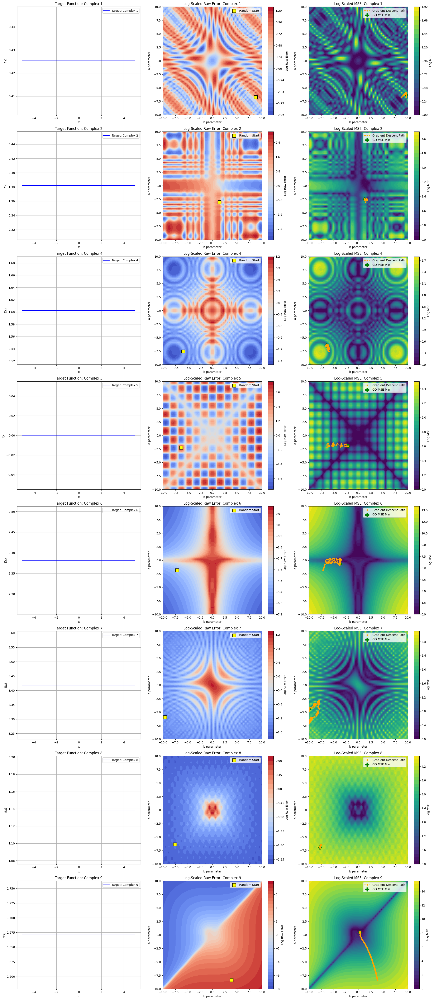

In [25]:
# Define search space and parameters
a_values = np.linspace(-10, 10, 50)
b_values = np.linspace(-10, 10, 50)
num_points = 100
x_range_1D = np.linspace(-5, 5, num_points)
epsilon = 1e-6

# Gradient descent function
def gradient_descent_mse(a_start, b_start, mse_grid, a_vals, b_vals, learning_rate=0.1, max_iter=10000, tol=1e-9):
    a_current, b_current = a_start, b_start
    path = [(a_current, b_current)]
    
    # Define epsilon as grid step size
    epsilon_a = a_vals[1] - a_vals[0]
    epsilon_b = b_vals[1] - b_vals[0]

    for _ in range(max_iter):
        idx_a = (np.abs(a_vals - a_current)).argmin()
        idx_b = (np.abs(b_vals - b_current)).argmin()
        mse_current = mse_grid[idx_a, idx_b]

        #epsilon = 1e-5
        #a_step = a_current + epsilon if a_current + epsilon <= a_vals[-1] else a_current
        #b_step = b_current + epsilon if b_current + epsilon <= b_vals[-1] else b_current
        
         # Ensure steps align with grid
        a_step = a_current + epsilon_a if a_current + epsilon_a <= a_vals[-1] else a_current
        b_step = b_current + epsilon_b if b_current + epsilon_b <= b_vals[-1] else b_current


        idx_a_step = (np.abs(a_vals - a_step)).argmin()
        idx_b_step = (np.abs(b_vals - b_step)).argmin()

        #grad_a = (mse_grid[idx_a_step, idx_b] - mse_current) / epsilon
        #grad_b = (mse_grid[idx_a, idx_b_step] - mse_current) / epsilon

        grad_a = (mse_grid[idx_a_step, idx_b] - mse_current) / epsilon_a
        grad_b = (mse_grid[idx_a, idx_b_step] - mse_current) / epsilon_b
        
        a_new = a_current - learning_rate * grad_a
        b_new = b_current - learning_rate * grad_b

        a_new = np.clip(a_new, a_vals[0], a_vals[-1])
        b_new = np.clip(b_new, b_vals[0], b_vals[-1])

        if np.abs(a_new - a_current) < tol and np.abs(b_new - b_current) < tol:
            break

        a_current, b_current = a_new, b_new
        path.append((a_current, b_current))

    return a_current, b_current, path

# Run gradient descent for all functions and plot
fig, axs = plt.subplots(len(models), 3, figsize=(21, 6 * len(models)))

for idx, (name, model) in enumerate(models.items()):
    true_a, true_b = true_params[name]

    def target_function(x):
        return model(x, true_a, true_b)

    true_values_1D = np.array([target_function([x]) for x in x_range_1D])

    error_grid = np.zeros((len(a_values), len(b_values)))
    MSE_grid = np.zeros((len(a_values), len(b_values)))

    for i, a in enumerate(a_values):
        for j, b in enumerate(b_values):
            predicted_values = np.array([model([x], a, b) for x in x_range_1D])
            error_grid[i, j] = np.mean(true_values_1D - predicted_values)
            MSE_grid[i, j] = np.mean((true_values_1D - predicted_values) ** 2)

    error_grid_log = np.sign(error_grid) * np.log1p(np.abs(error_grid) + epsilon)
    MSE_grid_log = np.log1p(MSE_grid + epsilon)
    
    #error_grid_log = error_grid
    #MSE_grid_log = MSE_grid

    a_random = random.choice(a_values)
    b_random = random.choice(b_values)

    a_gd_min, b_gd_min, gd_path = gradient_descent_mse(a_random, b_random, MSE_grid_log, a_values, b_values)

    axs[idx, 0].plot(x_range_1D, true_values_1D, color='blue', label=f"Target: {name}")
    axs[idx, 0].set_title(f"Target Function: {name}")
    axs[idx, 0].set_xlabel("x")
    axs[idx, 0].set_ylabel("f(x)")
    axs[idx, 0].grid(True)
    axs[idx, 0].legend()

    cmap1 = axs[idx, 1].contourf(b_values, a_values, error_grid_log, levels=30, cmap="coolwarm")
    axs[idx, 1].scatter(b_random, a_random, color="yellow", marker="s", edgecolors="black", s=120, label="Random Start")
    axs[idx, 1].set_title(f"Log-Scaled Raw Error: {name}")
    axs[idx, 1].set_xlabel("b parameter")
    axs[idx, 1].set_ylabel("a parameter")
    fig.colorbar(cmap1, ax=axs[idx, 1], label="Log Raw Error")
    axs[idx, 1].legend(loc="upper right")

    cmap2 = axs[idx, 2].contourf(b_values, a_values, MSE_grid_log, levels=30, cmap="viridis")
    gd_path_array = np.array(gd_path)
    axs[idx, 2].plot(gd_path_array[:, 1], gd_path_array[:, 0], color="orange", linestyle="--", marker="o", markersize=4, label="Gradient Descent Path")
    axs[idx, 2].scatter(b_gd_min, a_gd_min, color="green", marker="P", s=160, label="GD MSE Min")
    axs[idx, 2].set_title(f"Log-Scaled MSE: {name}")
    axs[idx, 2].set_xlabel("b parameter")
    axs[idx, 2].set_ylabel("a parameter")
    fig.colorbar(cmap2, ax=axs[idx, 2], label="Log MSE")
    axs[idx, 2].legend(loc="upper right")

plt.tight_layout()
plt.show()


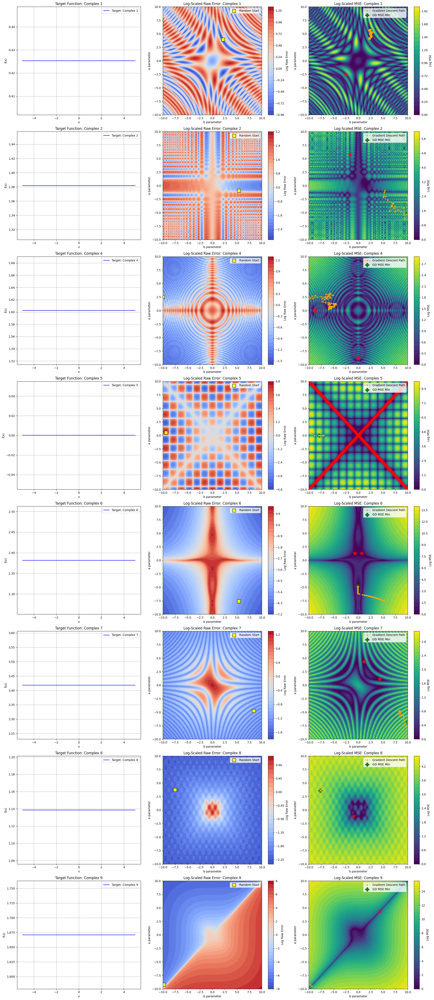

In [26]:
# Define search space and parameters
a_values = np.linspace(-10, 10, 100)
b_values = np.linspace(-10, 10, 100)
num_points = 10
x_range_1D = np.linspace(-5, 5, num_points)
epsilon = 1e-6

"""
def linear_model(x, a, b):
    return a * np.array(x) + b

def quadratic_model(x, a, b):
    return a * np.array(x) ** 2 + b

models = {'Linear': linear_model, 'Quadratic': quadratic_model}
true_params = {'Linear': (2, -3), 'Quadratic': (1, 4)}
"""

# Gradient descent function
def gradient_descent_mse(a_start, b_start, mse_grid, a_vals, b_vals, learning_rate=0.1, max_iter=10000, tol=1e-12):
    a_current, b_current = a_start, b_start
    path = [(a_current, b_current)]
    
    epsilon_a = a_vals[1] - a_vals[0]
    epsilon_b = b_vals[1] - b_vals[0]

    for _ in range(max_iter):
        idx_a = (np.abs(a_vals - a_current)).argmin()
        idx_b = (np.abs(b_vals - b_current)).argmin()
        mse_current = mse_grid[idx_a, idx_b]

        a_step = a_current + epsilon_a if a_current + epsilon_a <= a_vals[-1] else a_current
        b_step = b_current + epsilon_b if b_current + epsilon_b <= b_vals[-1] else b_current

        idx_a_step = (np.abs(a_vals - a_step)).argmin()
        idx_b_step = (np.abs(b_vals - b_step)).argmin()

        grad_a = (mse_grid[idx_a_step, idx_b] - mse_current) / epsilon_a
        grad_b = (mse_grid[idx_a, idx_b_step] - mse_current) / epsilon_b
        
        a_new = a_current - learning_rate * grad_a
        b_new = b_current - learning_rate * grad_b

        a_new = np.clip(a_new, a_vals[0], a_vals[-1])
        b_new = np.clip(b_new, b_vals[0], b_vals[-1])

        if np.abs(a_new - a_current) < tol and np.abs(b_new - b_current) < tol:
            break

        a_current, b_current = a_new, b_new
        path.append((a_current, b_current))

    return a_current, b_current, path

# Run gradient descent for all functions and plot
fig, axs = plt.subplots(len(models), 3, figsize=(21, 6 * len(models)))

for idx, (name, model) in enumerate(models.items()):
    true_a, true_b = true_params[name]

    def target_function(x):
        return model(x, true_a, true_b)

    true_values_1D = np.array([target_function([x]) for x in x_range_1D])

    error_grid = np.zeros((len(a_values), len(b_values)))
    MSE_grid = np.zeros((len(a_values), len(b_values)))

    for i, a in enumerate(a_values):
        for j, b in enumerate(b_values):
            predicted_values = np.array([model([x], a, b) for x in x_range_1D])
            error_grid[i, j] = np.mean(true_values_1D - predicted_values)
            MSE_grid[i, j] = np.mean((true_values_1D - predicted_values) ** 2)

    error_grid_log = np.sign(error_grid) * np.log1p(np.abs(error_grid) + epsilon)
    MSE_grid_log = np.log1p(MSE_grid + epsilon)

    # Find global minima
    global_min_value = np.min(MSE_grid_log)
    global_min_indices = np.argwhere(MSE_grid_log == global_min_value)
    global_min_coords = [(a_values[i], b_values[j]) for i, j in global_min_indices]

    # Random starting point for gradient descent
    a_random = random.choice(a_values)
    b_random = random.choice(b_values)

    a_gd_min, b_gd_min, gd_path = gradient_descent_mse(a_random, b_random, MSE_grid_log, a_values, b_values)

    # Plot target function
    axs[idx, 0].plot(x_range_1D, true_values_1D, color='blue', label=f"Target: {name}")
    axs[idx, 0].set_title(f"Target Function: {name}")
    axs[idx, 0].set_xlabel("x")
    axs[idx, 0].set_ylabel("f(x)")
    axs[idx, 0].grid(True)
    axs[idx, 0].legend()

    # Plot raw error grid
    cmap1 = axs[idx, 1].contourf(b_values, a_values, error_grid_log, levels=30, cmap="coolwarm")
    axs[idx, 1].scatter(b_random, a_random, color="yellow", marker="s", edgecolors="black", s=120, label="Random Start")
    axs[idx, 1].set_title(f"Log-Scaled Raw Error: {name}")
    axs[idx, 1].set_xlabel("b parameter")
    axs[idx, 1].set_ylabel("a parameter")
    fig.colorbar(cmap1, ax=axs[idx, 1], label="Log Raw Error")
    axs[idx, 1].legend(loc="upper right")

    # Plot MSE grid with global minima
    cmap2 = axs[idx, 2].contourf(b_values, a_values, MSE_grid_log, levels=30, cmap="viridis")
    gd_path_array = np.array(gd_path)
    axs[idx, 2].plot(gd_path_array[:, 1], gd_path_array[:, 0], color="orange", linestyle="--", marker="o", markersize=4, label="Gradient Descent Path")
    axs[idx, 2].scatter(b_gd_min, a_gd_min, color="green", marker="P", s=160, label="GD MSE Min")

    # Mark global minima
    for a_min, b_min in global_min_coords:
        axs[idx, 2].scatter(b_min, a_min, color="red", marker="*", s=200)#, label="Global Minimum")

    axs[idx, 2].set_title(f"Log-Scaled MSE: {name}")
    axs[idx, 2].set_xlabel("b parameter")
    axs[idx, 2].set_ylabel("a parameter")
    fig.colorbar(cmap2, ax=axs[idx, 2], label="Log MSE")
    axs[idx, 2].legend(loc="upper right")

plt.tight_layout()
plt.show()


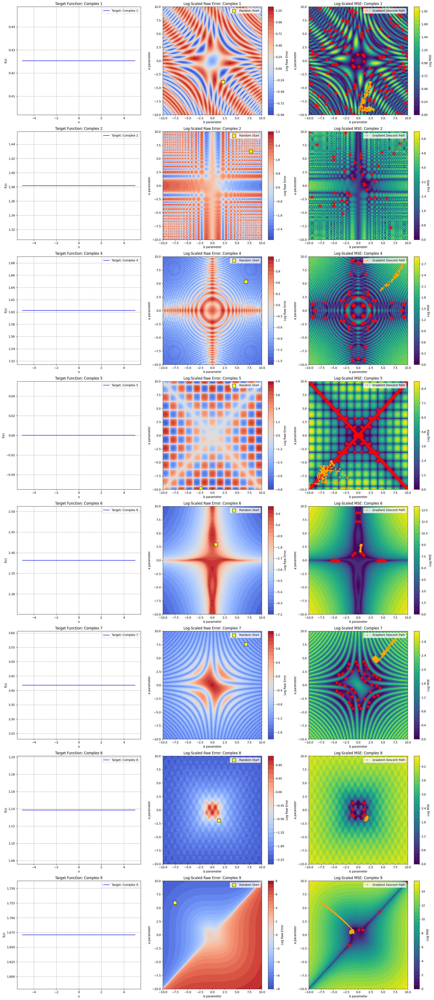

In [32]:
# Define a threshold for values close to zero
threshold = 1e-3

# Run gradient descent for all functions and plot without clustering
fig, axs = plt.subplots(len(models), 3, figsize=(21, 6 * len(models)))

for idx, (name, model) in enumerate(models.items()):
    true_a, true_b = true_params[name]

    def target_function(x):
        return model(x, true_a, true_b)

    true_values_1D = np.array([target_function([x]) for x in x_range_1D])

    error_grid = np.zeros((len(a_values), len(b_values)))
    MSE_grid = np.zeros((len(a_values), len(b_values)))

    for i, a in enumerate(a_values):
        for j, b in enumerate(b_values):
            predicted_values = np.array([model([x], a, b) for x in x_range_1D])
            error_grid[i, j] = np.mean(true_values_1D - predicted_values)
            MSE_grid[i, j] = np.mean((true_values_1D - predicted_values) ** 2)

    error_grid_log = np.sign(error_grid) * np.log1p(np.abs(error_grid) + epsilon)
    MSE_grid_log = np.log1p(MSE_grid + epsilon)

    # Find points close to zero
    near_zero_indices = np.argwhere(MSE_grid_log < np.log1p(threshold))
    near_zero_coords = np.array([(a_values[i], b_values[j]) for i, j in near_zero_indices])

    # Random starting point for gradient descent
    a_random = random.choice(a_values)
    b_random = random.choice(b_values)

    a_gd_min, b_gd_min, gd_path = gradient_descent_mse(a_random, b_random, MSE_grid_log, a_values, b_values)

    # Plot target function
    axs[idx, 0].plot(x_range_1D, true_values_1D, color='blue', label=f"Target: {name}")
    axs[idx, 0].set_title(f"Target Function: {name}")
    axs[idx, 0].set_xlabel("x")
    axs[idx, 0].set_ylabel("f(x)")
    axs[idx, 0].grid(True)
    axs[idx, 0].legend()

    # Plot raw error grid
    cmap1 = axs[idx, 1].contourf(b_values, a_values, error_grid_log, levels=30, cmap="coolwarm")
    axs[idx, 1].scatter(b_random, a_random, color="yellow", marker="s", edgecolors="black", s=120, label="Random Start")
    axs[idx, 1].set_title(f"Log-Scaled Raw Error: {name}")
    axs[idx, 1].set_xlabel("b parameter")
    axs[idx, 1].set_ylabel("a parameter")
    fig.colorbar(cmap1, ax=axs[idx, 1], label="Log Raw Error")
    axs[idx, 1].legend(loc="upper right")

    # Plot MSE grid with all near-zero minima
    cmap2 = axs[idx, 2].contourf(b_values, a_values, MSE_grid_log, levels=30, cmap="viridis")
    gd_path_array = np.array(gd_path)
    axs[idx, 2].plot(gd_path_array[:, 1], gd_path_array[:, 0], color="orange", linestyle="--", marker="o", markersize=4, label="Gradient Descent Path")
    axs[idx, 2].scatter(b_gd_min, a_gd_min, color="green", marker="P", s=160)#, label="GD MSE Min")

    # Mark all near-zero points
    for coord in near_zero_coords:
        axs[idx, 2].scatter(coord[1], coord[0], color="red", marker="*", s=200)#, label="Near-Zero Minimum")

    axs[idx, 2].set_title(f"Log-Scaled MSE: {name}")
    axs[idx, 2].set_xlabel("b parameter")
    axs[idx, 2].set_ylabel("a parameter")
    fig.colorbar(cmap2, ax=axs[idx, 2], label="Log MSE")
    axs[idx, 2].legend(loc="upper right")

plt.tight_layout()
plt.show()


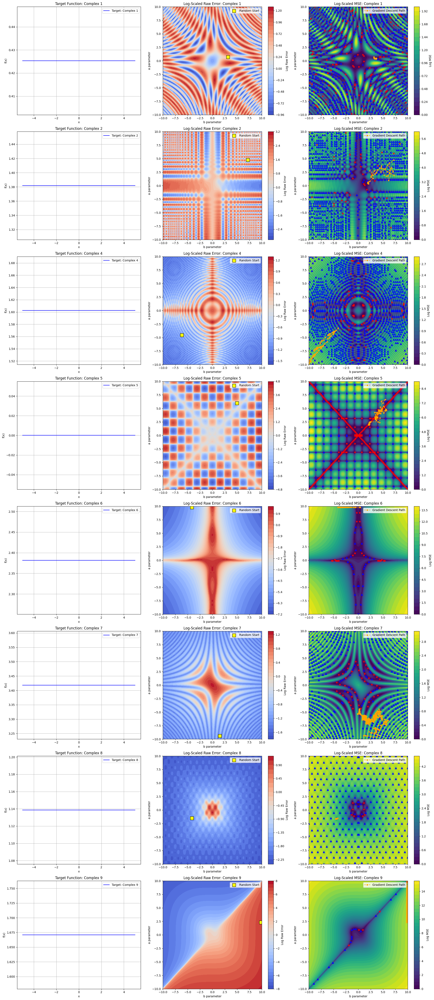

In [28]:
from scipy.ndimage import minimum_filter

# Define a threshold for near-zero and local minima detection
threshold = 1e-3

# Run gradient descent for all functions and plot with non-zero local minima marked
fig, axs = plt.subplots(len(models), 3, figsize=(21, 6 * len(models)))

for idx, (name, model) in enumerate(models.items()):
    true_a, true_b = true_params[name]

    def target_function(x):
        return model(x, true_a, true_b)

    true_values_1D = np.array([target_function([x]) for x in x_range_1D])

    error_grid = np.zeros((len(a_values), len(b_values)))
    MSE_grid = np.zeros((len(a_values), len(b_values)))

    for i, a in enumerate(a_values):
        for j, b in enumerate(b_values):
            predicted_values = np.array([model([x], a, b) for x in x_range_1D])
            error_grid[i, j] = np.mean(true_values_1D - predicted_values)
            MSE_grid[i, j] = np.mean((true_values_1D - predicted_values) ** 2)

    error_grid_log = np.sign(error_grid) * np.log1p(np.abs(error_grid) + epsilon)
    MSE_grid_log = np.log1p(MSE_grid + epsilon)

    # Find points close to zero
    near_zero_indices = np.argwhere(MSE_grid_log < np.log1p(threshold))
    near_zero_coords = np.array([(a_values[i], b_values[j]) for i, j in near_zero_indices])

    # Detect local minima using a minimum filter
    local_minima_mask = (MSE_grid_log == minimum_filter(MSE_grid_log, size=3))
    local_minima_indices = np.argwhere(local_minima_mask)

    # Filter out near-zero local minima
    non_zero_local_minima = []
    for i, j in local_minima_indices:
        if MSE_grid_log[i, j] >= np.log1p(threshold):
            non_zero_local_minima.append((a_values[i], b_values[j]))

    # Random starting point for gradient descent
    a_random = random.choice(a_values)
    b_random = random.choice(b_values)

    a_gd_min, b_gd_min, gd_path = gradient_descent_mse(a_random, b_random, MSE_grid_log, a_values, b_values)

    # Plot target function
    axs[idx, 0].plot(x_range_1D, true_values_1D, color='blue', label=f"Target: {name}")
    axs[idx, 0].set_title(f"Target Function: {name}")
    axs[idx, 0].set_xlabel("x")
    axs[idx, 0].set_ylabel("f(x)")
    axs[idx, 0].grid(True)
    axs[idx, 0].legend()

    # Plot raw error grid
    cmap1 = axs[idx, 1].contourf(b_values, a_values, error_grid_log, levels=30, cmap="coolwarm")
    axs[idx, 1].scatter(b_random, a_random, color="yellow", marker="s", edgecolors="black", s=120, label="Random Start")
    axs[idx, 1].set_title(f"Log-Scaled Raw Error: {name}")
    axs[idx, 1].set_xlabel("b parameter")
    axs[idx, 1].set_ylabel("a parameter")
    fig.colorbar(cmap1, ax=axs[idx, 1], label="Log Raw Error")
    axs[idx, 1].legend(loc="upper right")

    # Plot MSE grid with all minima marked
    cmap2 = axs[idx, 2].contourf(b_values, a_values, MSE_grid_log, levels=30, cmap="viridis")
    gd_path_array = np.array(gd_path)
    axs[idx, 2].plot(gd_path_array[:, 1], gd_path_array[:, 0], color="orange", linestyle="--", marker="o", markersize=4, label="Gradient Descent Path")
    axs[idx, 2].scatter(b_gd_min, a_gd_min, color="green", marker="P")#, s=160, label="GD MSE Min")

    # Mark near-zero minima
    for coord in near_zero_coords:
        axs[idx, 2].scatter(coord[1], coord[0], color="red", marker="*")#, s=200, label="Near-Zero Minimum")

    # Mark non-zero local minima
    for coord in non_zero_local_minima:
        axs[idx, 2].scatter(coord[1], coord[0], color="blue", marker="^")#, s=150, label="Non-Zero Local Minimum")

    axs[idx, 2].set_title(f"Log-Scaled MSE: {name}")
    axs[idx, 2].set_xlabel("b parameter")
    axs[idx, 2].set_ylabel("a parameter")
    fig.colorbar(cmap2, ax=axs[idx, 2], label="Log MSE")
    axs[idx, 2].legend(loc="upper right")

plt.tight_layout()
plt.show()


In [29]:
#--------------------------------
# I now need to create crazy models that are crazy non linear conbination that lead to non convexity, instead of using this well behaved functions. Perhaps generate functions randomly
#--------------------------------

In [30]:
#1) Is it possible to classify regions? Like there is 4 way montain were I should actually go to where the gradient is pointing instead of the cut in half